In [1]:
#라이브러리 버전 확인
import keras_ocr
import pytesseract

print(keras_ocr.__version__)
print(pytesseract.__version__)
# pytesseract는 tesseract-ocr에 종속적. 실행되지 않을 경우 터미널에서 아래 명령어 실행
# !sudo apt install tesseract-ocr

0.8.8
0.3.8


In [2]:
import matplotlib.pyplot as plt
import os
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt
import cv2

# 파일 경로 지정

In [3]:
file_dir = os.getenv("HOME")+ '/aiffel/ocr_python/test_image/test'
file_list = os.listdir(file_dir)

file_list = [os.path.join(file_dir,file_list[i]) for i in range(len(file_list))]
file_list.sort()
file_list

['/aiffel/aiffel/ocr_python/test_image/test/test0.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test1.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test2.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test3.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test4.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test5.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test6.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test7.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test8.png',
 '/aiffel/aiffel/ocr_python/test_image/test/test9.png']

# 케라스 OCR 사용

In [4]:
pipeline = keras_ocr.pipeline.Pipeline()

Looking for /aiffel/.keras-ocr/craft_mlt_25k.h5
Looking for /aiffel/.keras-ocr/crnn_kurapan.h5


In [5]:
#이미지 입력단계
images = [ keras_ocr.tools.read(file) for file in file_list]
prediction_groups = [pipeline.recognize([file]) for file in file_list]

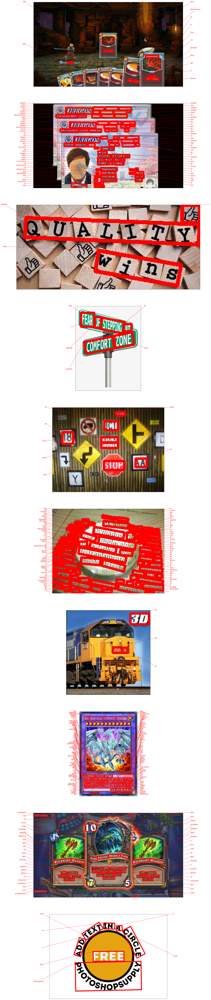

In [6]:
# Plot the predictions
fig, axs = plt.subplots(nrows=len(images), figsize=(150, 150))
for idx, ax in enumerate(axs):
    keras_ocr.tools.drawAnnotations(image=images[idx], 
                                    predictions=prediction_groups[idx][0], ax=ax)

##### 휘어짐이 없는 단어들에 대해서는 매우 인식이 잘 되었습니다. 각도가 어느정도 돌아간 이미지도 역시 어느정도 잡아내는 것을 보입니다. 그리고 작아서 인식하지 못할 것이라 생각한 부분도 어느정도 인식을 하고 있는 것이 보입니다.
##### 하지만, 휘어짐이 존재하는 단어는 전혀 다른 단어로 인식하는 것을 볼 수 있습니다. 뿐만 아니라 거꾸로 쓰여져 있는 글자(열차 사진)도 제대로 인식하지 못합니다. 운전 면허증의 경우에는 인식하지 말아야하는 단어마저 인식하는 등 개선이 필요해 보입니다.

# 테서랙트 사용

In [7]:
#문자검출 + 이미지 자르기
import os
import pytesseract
from PIL import Image
from pytesseract import Output
import matplotlib.pyplot as plt

def crop_word_regions(image_path, output_path):
    if not os.path.exists(output_path):
        os.mkdir(output_path)
    custom_oem_psm_config = r'--oem 3 --psm 3'
    image = Image.open(image_path)

    recognized_data = pytesseract.image_to_data(
        image, lang='eng',    # 한국어라면 lang='kor'
        config=custom_oem_psm_config,
        output_type=Output.DICT
    )
    
    top_level = max(recognized_data['level'])
    index = 0
    cropped_image_path_list = []
    for i in range(len(recognized_data['level'])):
        level = recognized_data['level'][i]
    
        if level == top_level:
            left = recognized_data['left'][i]
            top = recognized_data['top'][i]
            width = recognized_data['width'][i]
            height = recognized_data['height'][i]
            
            output_img_path = os.path.join(output_path, f"{str(index).zfill(4)}.png")
            print(output_img_path)
            cropped_image = image.crop((
                left,
                top,
                left+width,
                top+height
            ))
            cropped_image.save(output_img_path)
            cropped_image_path_list.append(output_img_path)
            index += 1
    return cropped_image_path_list

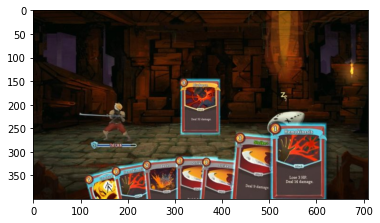

/aiffel/aiffel/ocr_python/test_image/0000.png


In [8]:
#0번사진 잘린 위치 확인
work_dir = os.getenv('HOME')+'/aiffel/ocr_python/test_image'
img_file_path = work_dir + '/test0.png'   #테스트용 이미지 경로

img_bgr = cv2.imread(img_file_path)
img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
plt.show()

cropped_image_path_list = crop_word_regions(img_file_path, work_dir)

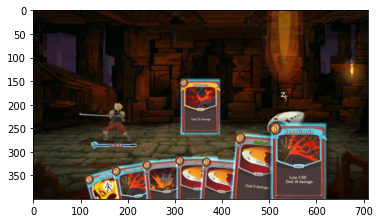

/aiffel/aiffel/ocr_python/test_image/0000.png


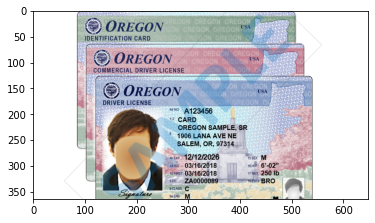

/aiffel/aiffel/ocr_python/test_image/0000.png
/aiffel/aiffel/ocr_python/test_image/0001.png
/aiffel/aiffel/ocr_python/test_image/0002.png
/aiffel/aiffel/ocr_python/test_image/0003.png
/aiffel/aiffel/ocr_python/test_image/0004.png
/aiffel/aiffel/ocr_python/test_image/0005.png
/aiffel/aiffel/ocr_python/test_image/0006.png
/aiffel/aiffel/ocr_python/test_image/0007.png
/aiffel/aiffel/ocr_python/test_image/0008.png
/aiffel/aiffel/ocr_python/test_image/0009.png
/aiffel/aiffel/ocr_python/test_image/0010.png
/aiffel/aiffel/ocr_python/test_image/0011.png
/aiffel/aiffel/ocr_python/test_image/0012.png
/aiffel/aiffel/ocr_python/test_image/0013.png
/aiffel/aiffel/ocr_python/test_image/0014.png
/aiffel/aiffel/ocr_python/test_image/0015.png
/aiffel/aiffel/ocr_python/test_image/0016.png
/aiffel/aiffel/ocr_python/test_image/0017.png


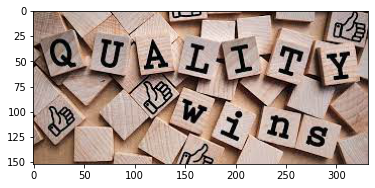

/aiffel/aiffel/ocr_python/test_image/0000.png


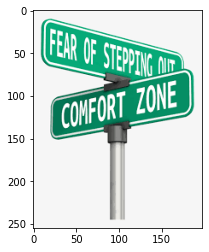

/aiffel/aiffel/ocr_python/test_image/0000.png


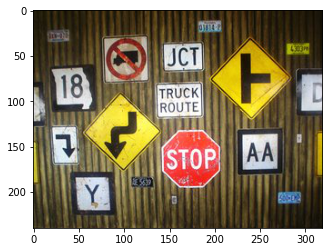

/aiffel/aiffel/ocr_python/test_image/0000.png


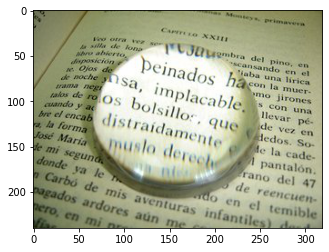

/aiffel/aiffel/ocr_python/test_image/0000.png


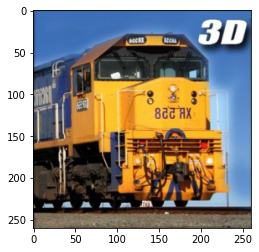

/aiffel/aiffel/ocr_python/test_image/0000.png


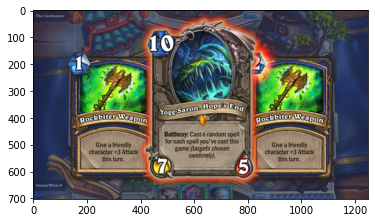

/aiffel/aiffel/ocr_python/test_image/0000.png
/aiffel/aiffel/ocr_python/test_image/0001.png
/aiffel/aiffel/ocr_python/test_image/0002.png
/aiffel/aiffel/ocr_python/test_image/0003.png
/aiffel/aiffel/ocr_python/test_image/0004.png
/aiffel/aiffel/ocr_python/test_image/0005.png
/aiffel/aiffel/ocr_python/test_image/0006.png
/aiffel/aiffel/ocr_python/test_image/0007.png
/aiffel/aiffel/ocr_python/test_image/0008.png
/aiffel/aiffel/ocr_python/test_image/0009.png
/aiffel/aiffel/ocr_python/test_image/0010.png
/aiffel/aiffel/ocr_python/test_image/0011.png
/aiffel/aiffel/ocr_python/test_image/0012.png
/aiffel/aiffel/ocr_python/test_image/0013.png
/aiffel/aiffel/ocr_python/test_image/0014.png
/aiffel/aiffel/ocr_python/test_image/0015.png
/aiffel/aiffel/ocr_python/test_image/0016.png
/aiffel/aiffel/ocr_python/test_image/0017.png
/aiffel/aiffel/ocr_python/test_image/0018.png
/aiffel/aiffel/ocr_python/test_image/0019.png
/aiffel/aiffel/ocr_python/test_image/0020.png
/aiffel/aiffel/ocr_python/test_ima

In [9]:
for i in range(len(file_list)-1): #마지막 이미지는 하나의 단어만 인식해서 그나마 경우의 수가 많은 test8번을 쓰기위해 -1을 함
    if i==7:                   #파일형식 오류로 인하여 test7 = 8번째 파일이 열리지 않음
        continue
    img_file_path = work_dir + '/test%d.png' %i   #테스트용 이미지 경로. 

    image = Image.open(img_file_path)
    plt.imshow(image)
    plt.show()
    
    cropped_image_path_list = crop_word_regions(img_file_path, work_dir)

In [10]:
# 총 이미지 10개중에서 test7을 제외한 가장 많이 출력된 파일을 사용
#잘린 단어 인식
def recognize_images(cropped_image_path_list):
    custom_oem_psm_config = r'--oem 3 --psm 7'
    
    for image_path in cropped_image_path_list:
        image = Image.open(image_path)
        recognized_data = pytesseract.image_to_string(
            image, lang='eng',    # 한국어라면 lang='kor'
            config=custom_oem_psm_config,
            output_type=Output.DICT
        )
        print(recognized_data['text'])
    print("Done")

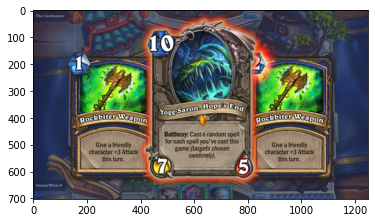

ine ine

Tide as

sumpy wizard

Give

a

friendly

character

+3

Attack


a Ce



set


for

each

spell

you've

cast

this

game

(targets

chosen

gee

Done


In [11]:
# 위에서 준비한 문자 영역 파일들을 인식하여 얻어진 텍스트를 출력

img_file_path = work_dir + '/test8.png'   #테스트용 이미지 경로. 

image = Image.open(img_file_path)
plt.imshow(image)
plt.show()
recognize_images(cropped_image_path_list)

단어의 인식이 제대로 되지 않은 부분이 일부 있습니다. 가장 중요한 카드의 이름을 인식하지 못하고 효과 단어중에서도 가장 단순한 부분만을 제대로 인식을 하였습니다.
이러한 결과를 볼 때 조금이라도 단어의 각도가 조금만 달라져도 인식을 못한다고 볼 수 있을 것입니다.

# 회고

### 케라스 OCR 
단어에 굴곡이 있는 부분에서는 올바른 결과를 얻지 못하였습니다.

전혀 다른 단어로 인식 하는 경우가 종종 있었고, 거꾸로 뒤집혀진 단어를 읽지 못하는 문제도 있었습니다.

위와 같은 이유를 제외하고는 대체적으로 훌륭한 인식률을 가지고 있습니다. 수많은 텍스트가 있을 때 대부분을 인식하고 정답률도 상당히 높은 모습을 보였습니다.

하지만 면허증의 경우에는 인식하지 말아야 할 부분까지 인식하는 모습을 보였습니다.

### tesseract
사용자의 문제인지 해당 라이브러리의 문제인지 모르겠습니다.
그나마 인식한 문장이 많은 이미지를 선택하였는데도 좋은 결과를 보여주지 못했습니다.
가장 중요한 이름 부분을 인식하지 못했는데, 단어의 굴곡이 원인인 것 같습니다.
케라스 OCR에 비해서 인식률이 저조한 것은 둘째로 하고, 단어의 정확도도 많이 떨어집니다.

### 총평
실제 서비스를 한다면 가장 상용화될 가능성이 높은 것은 도로주행 분야라고 생각합니다.
도로주행이 꼭 아니더라도 게임, 문학, 자동분류 등 여러 분야에 쓰일 수 있을 것입니다.
정확도도 중요하지만 특정 오브젝트를 인식하지 못하는 경우는 발생하여서는 안됩니다.

뿐만아니라 사용 편의성 역시 고려해야합니다. 케라스OCR은 비교적 간편한 접근성을 가졌지만, TESSERACT는 사용하기에 불편함을 많이 느꼈습니다.
따라서 만약 사용한다면 케라스 OCR을 사용할 것 같습니다.